TRT-LLM + Triton,
NIM NVIDIA Inference Microservice


TRT-LLM will give an inference engine. It needs to be hosted on some server to accept request and return response e.g. Triton Inference Server.

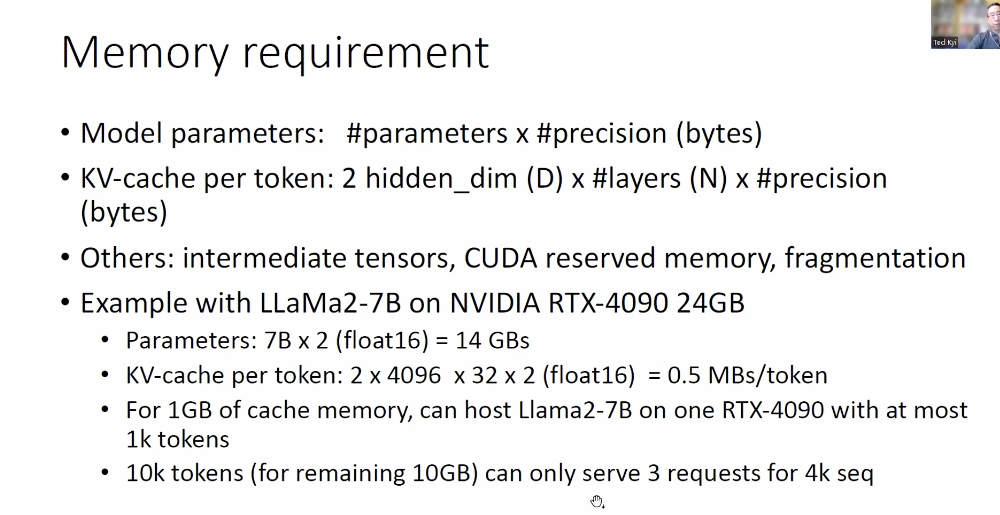

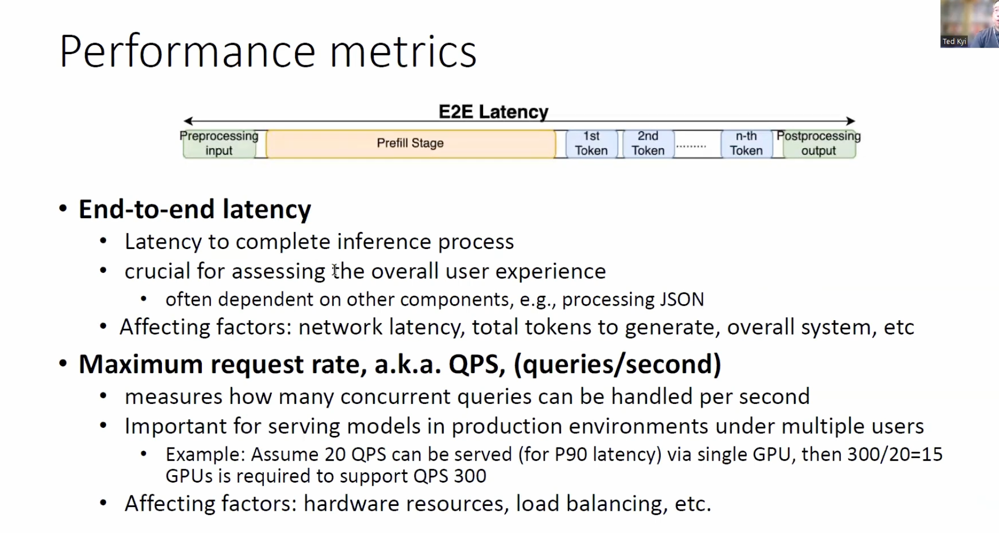

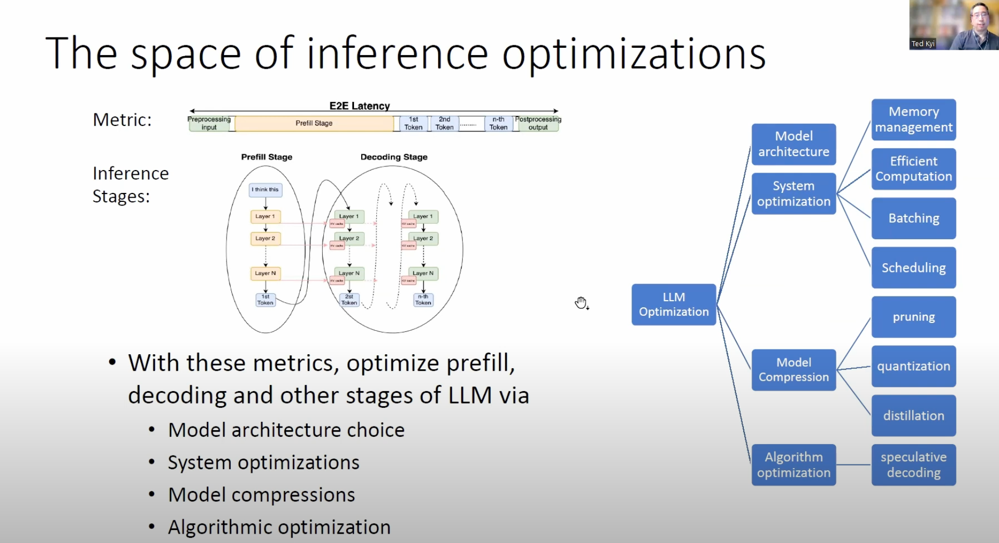

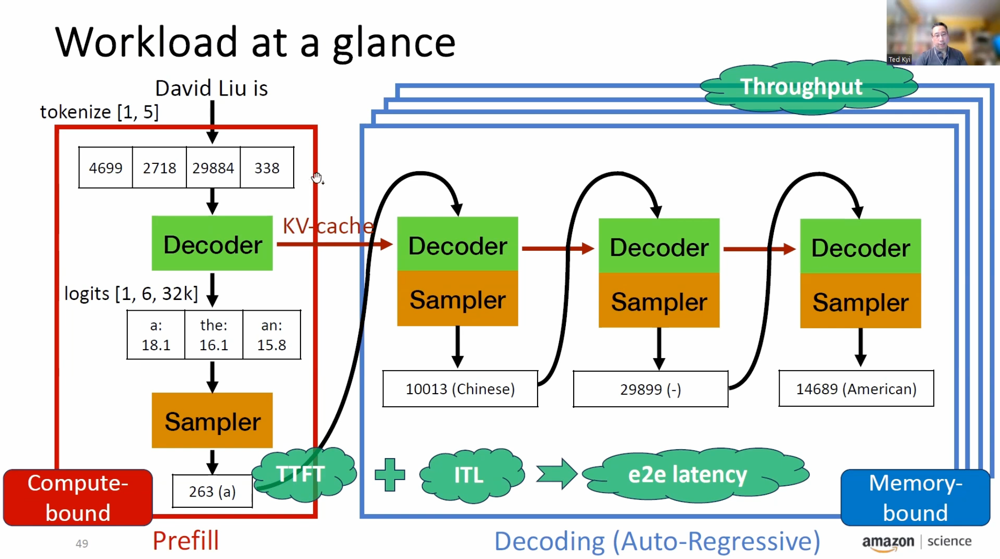

- TTFT - time to first token
- ITL - inter token latency
- e2e = TTFT + ITL

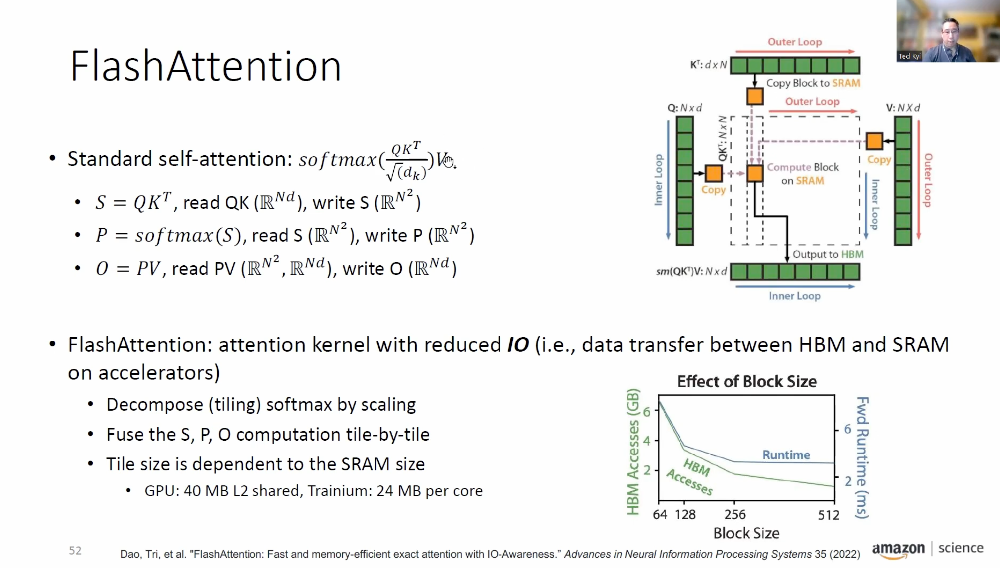

LOOK FOR THE PAPER. Attention Kernel

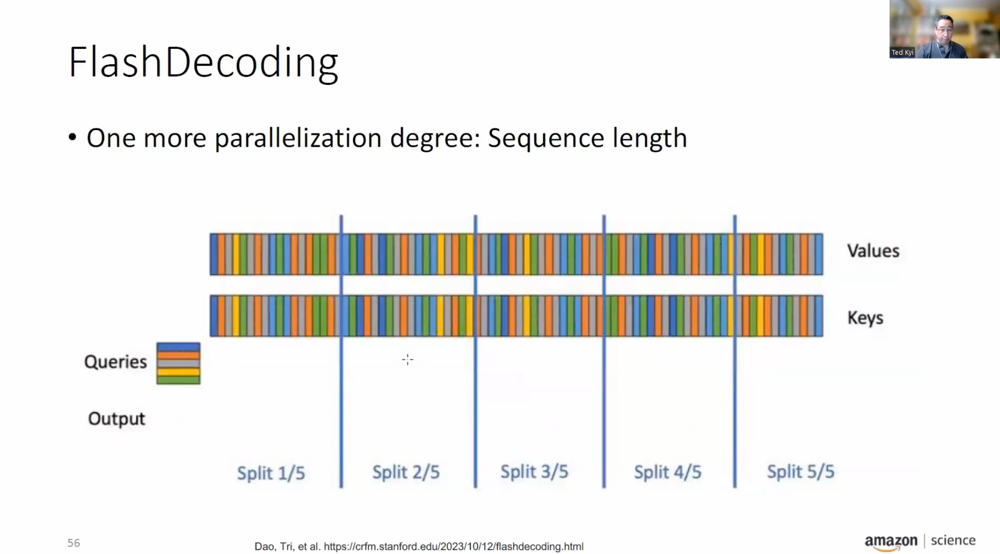


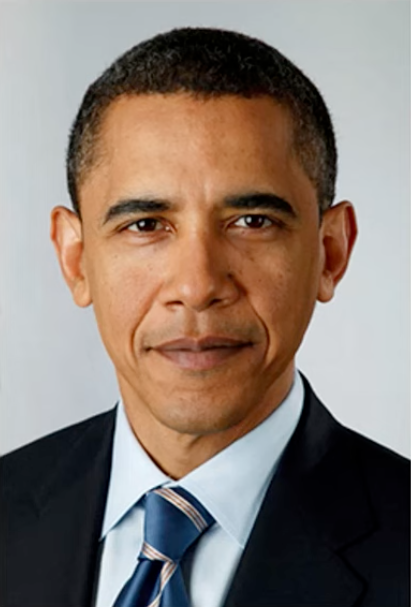
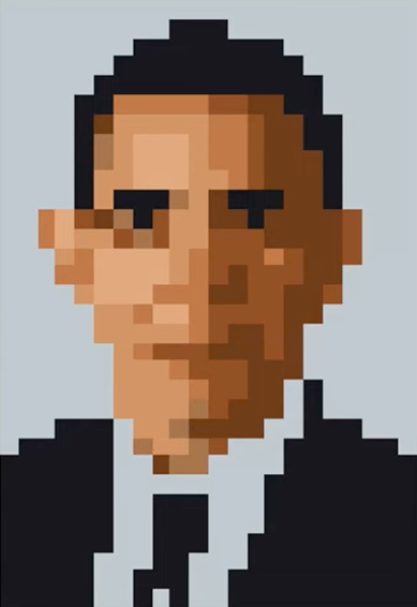

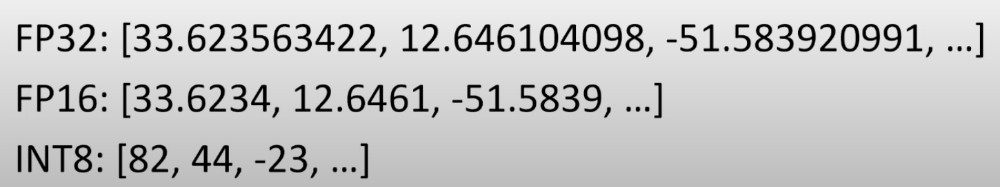

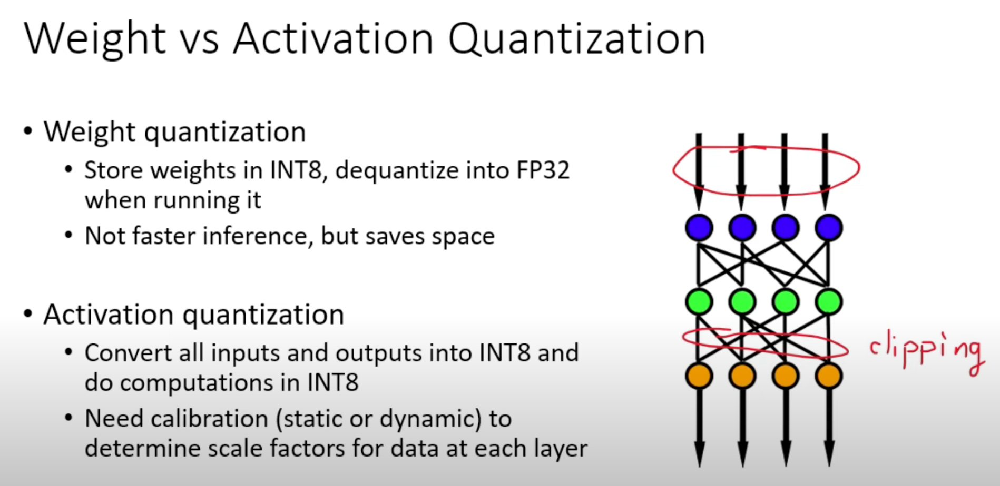

Prunning

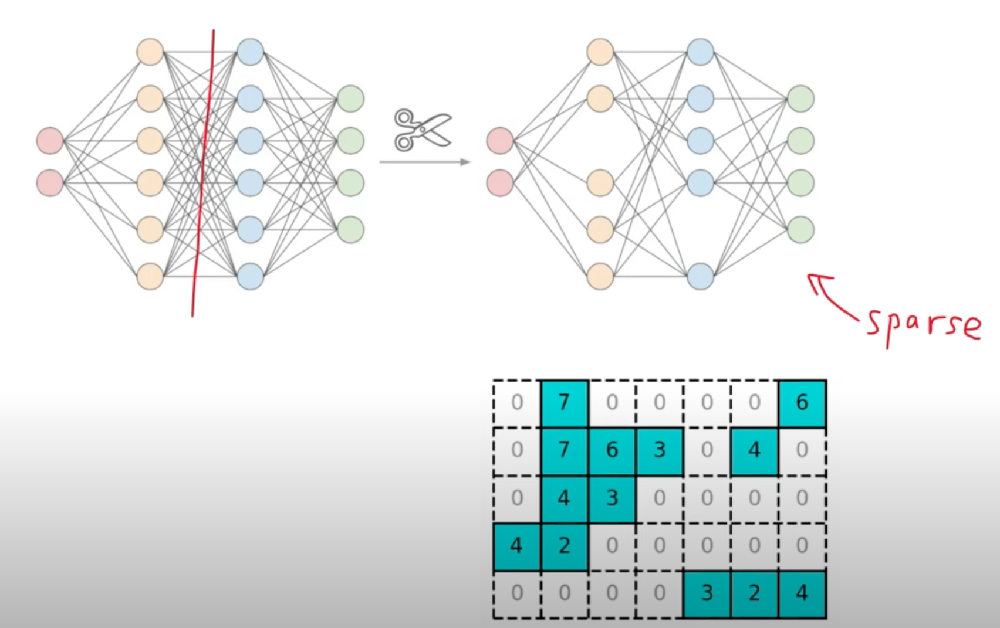

Look at this paper for distillation

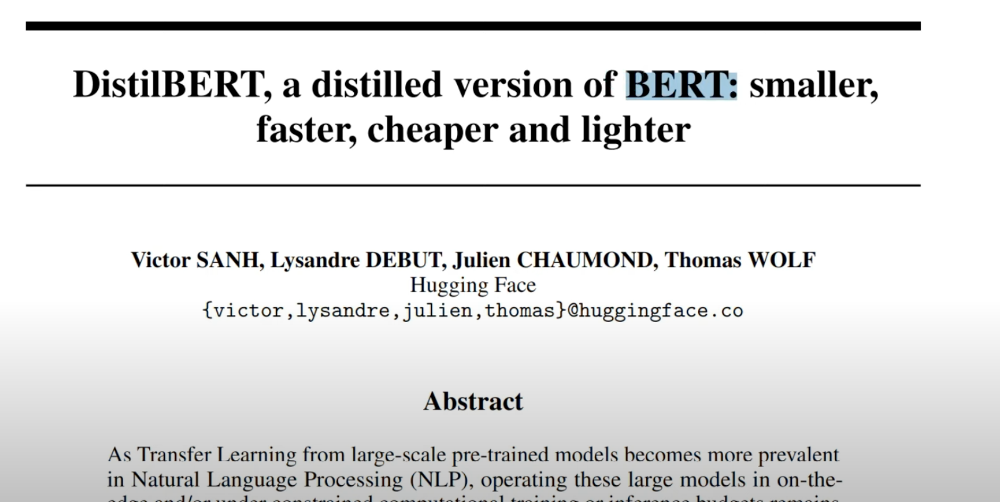

Look at fused kernal and Flash Attention paper
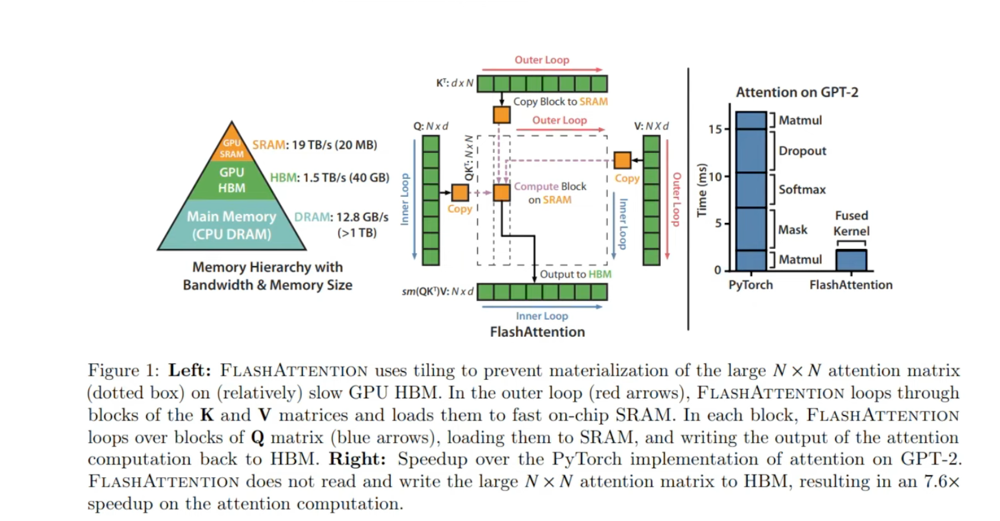

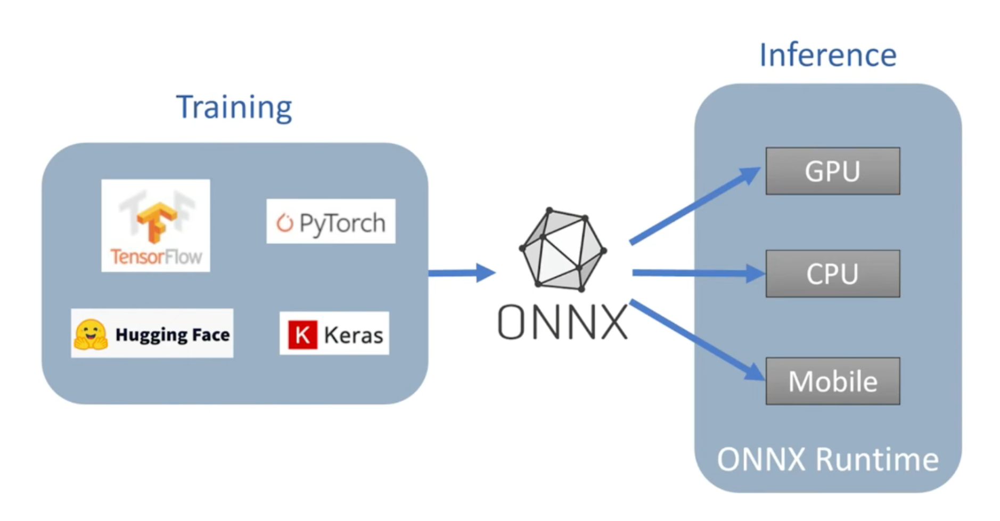

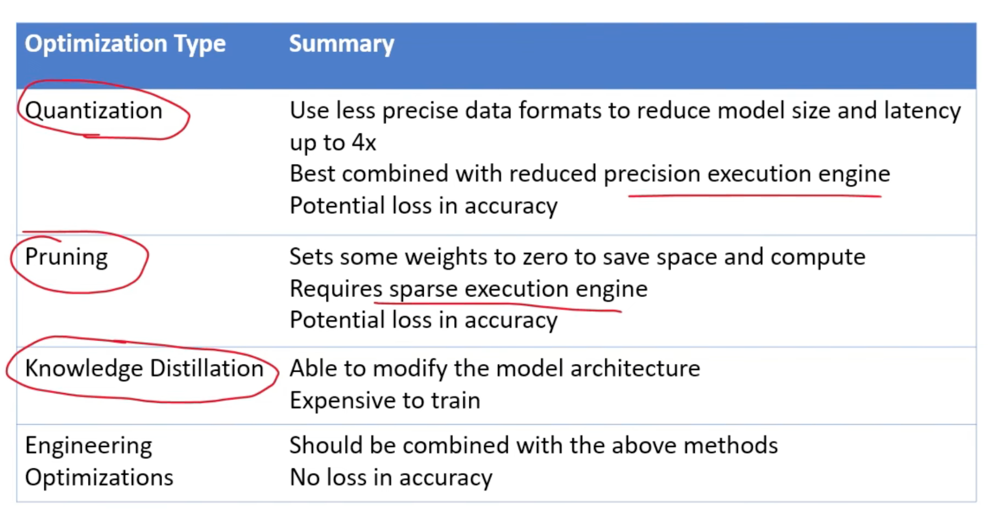

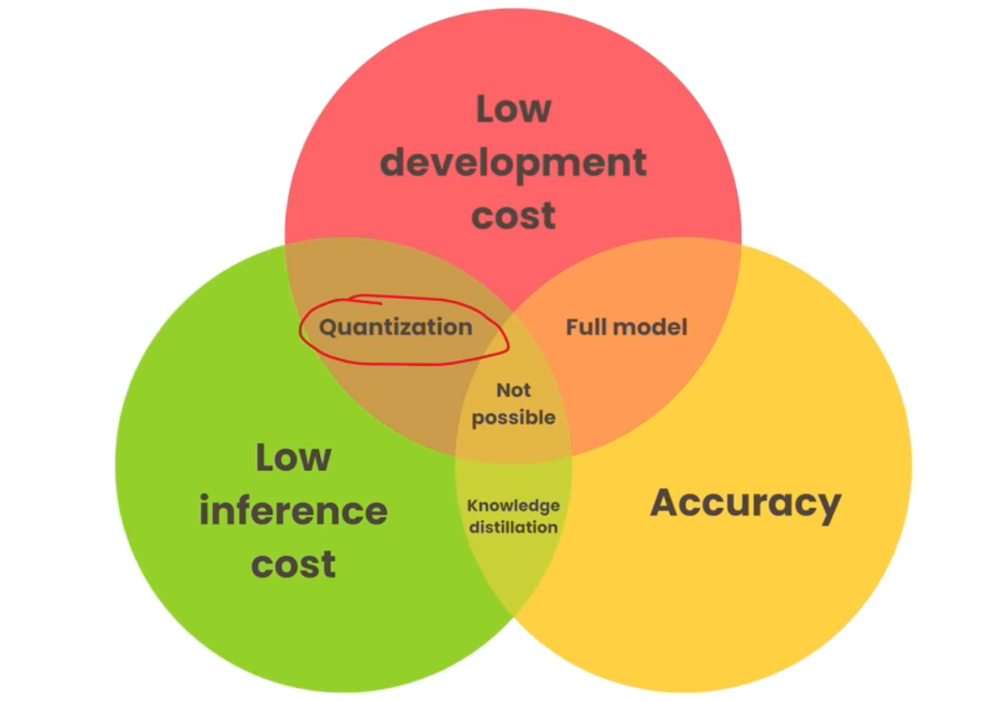

Compute the attention mechanism on the entire prompt (input token sequence).

if 1 Million people send 1 thousand tokens each, the model will compute the attention mechanism on 1 trillion tokens. This is a lot of computation, and it can be very slow.

In transformers based architecture, the attention mechanism computes attention scores between *each pair* of tokens in the input sequence. For a single input sequence of length $N$ tokens, the attention mechanism computes an $N \times N$ matrix (because each token attends to every token, including itself).

So, a single user input prompt includes **a sequence of 1,000 tokens**, the number of attention scores calculated is:

$$
1,000 \times 1,000 = 1,000,000 \quad \text{attention scores}
$$


In [2]:
# FLOPs Estimation for LLaMA 2 7B (32 layers, 32 heads)
# Input: 1000 tokens, d_model = 4096, heads = 32

N = 1000           # Sequence length
d_model = 4096     # Hidden size
h = 32             # Number of heads
d_k = d_v = 128    # Per-head dimension (4096 / 32)

# FLOPs breakdown:
# 1. Q, K, V projections: 3 * (N * d_model * d_model)
# 2. Attention score computation (Q x K^T): N * N * d_k * h
# 3. Softmax: N * N * h
# 4. Weighted sum (Attn x V): N * N * d_k * h
# 5. Final projection: N * d_model * d_model

qkv_proj_flops = 3 * N * d_model * d_model
attn_scores_flops = N * N * d_k * h
softmax_flops = N * N * h
attn_weighted_sum_flops = N * N * d_k * h
final_proj_flops = N * d_model * d_model

# Total FLOPs for one layer
total_flops_per_layer = (
    qkv_proj_flops +
    attn_scores_flops +
    softmax_flops +
    attn_weighted_sum_flops +
    final_proj_flops
)

# Multiply by number of layers
num_layers = 32
total_flops_all_layers = total_flops_per_layer * num_layers

print(f"Total FLOPs per layer: {total_flops_per_layer:,}")
print(f"Total FLOPs for 32 layers: {total_flops_all_layers:,}")


Total FLOPs per layer: 75,332,864,000
Total FLOPs for 32 layers: 2,410,651,648,000


In [4]:
# Enhanced FLOPs Estimation for LLaMA 2 7B (32 layers, 32 heads)
# Includes attention + MLP + residuals + layernorm

# Model configuration
N = 1000           # Sequence length (tokens)
d_model = 4096     # Hidden size
h = 32             # Number of attention heads
d_k = d_v = 128    # Per-head dimension (4096 / 32)
num_layers = 32

# 1. Q, K, V projections
qkv_proj_flops = 3 * N * d_model * d_model

# 2. Attention score computation (Q @ K^T)
attn_scores_flops = N * N * d_k * h

# 3. Softmax (approx 5 ops per element)
softmax_flops = 5 * N * N * h

# 4. Attention × V (weighted sum)
attn_weighted_sum_flops = N * N * d_k * h

# 5. Output projection
final_proj_flops = N * d_model * d_model

# 6. LayerNorm (done twice)
layernorm_flops = 2 * 2 * N * d_model

# 7. Residual connections (done twice)
residual_flops = 2 * N * d_model

# 8. MLP
mlp_flops = 2 * N * d_model * d_ff

# Total per-layer FLOPs
total_flops_per_layer = (
    qkv_proj_flops +
    attn_scores_flops +
    softmax_flops +
    attn_weighted_sum_flops +
    final_proj_flops +
    layernorm_flops +
    residual_flops +
    mlp_flops
)

total_flops_all_layers = total_flops_per_layer * num_layers

print(f"Total FLOPs per layer: {total_flops_per_layer:,}")
print(f"Total FLOPs for all 32 layers: {total_flops_all_layers:,}")



Total FLOPs per layer: 209,703,168,000
Total FLOPs for all 32 layers: 6,710,501,376,000


In [7]:
# LLaMA 2 7B model parameters
d_model = 4096
h = 32
d_k = d_model // h  # 128
d_ff = 4 * d_model  # 16384
num_layers = 32

# Token lengths
initial_context_tokens = 1000
num_generated_tokens = 1000

# Fixed FLOPs per layer (MLP, projections, residuals, norms)
qkv_proj_flops = 3 * d_model * d_model
output_proj_flops = d_model * d_model
mlp_flops = 2 * d_model * d_ff
norm_resid_flops = 4 * d_model  # 2 layernorms + 2 residual adds

fixed_flops_per_layer = qkv_proj_flops + output_proj_flops + mlp_flops + norm_resid_flops
fixed_flops_per_token = fixed_flops_per_layer * num_layers

# === 1. Prompt FLOPs (dense attention) ===
prompt_attention_flops = 0
for t in range(1, initial_context_tokens + 1):
    seq_len = t
    attn_scores = h * d_k * seq_len
    softmax = 5 * h * seq_len
    attn_v = h * d_k * seq_len
    attn_total = attn_scores + softmax + attn_v
    prompt_attention_flops += attn_total * num_layers

prompt_fixed_flops = fixed_flops_per_token * initial_context_tokens
prompt_total_flops = prompt_fixed_flops + prompt_attention_flops

# === 2. Generation FLOPs (autoregressive with caching) ===
generation_attention_flops = 0
for t in range(1, num_generated_tokens + 1):
    seq_len = initial_context_tokens + t - 1
    attn_scores = h * d_k * seq_len
    softmax = 5 * h * seq_len
    attn_v = h * d_k * seq_len
    attn_total = attn_scores + softmax + attn_v
    generation_attention_flops += attn_total * num_layers

generation_fixed_flops = fixed_flops_per_token * num_generated_tokens
generation_total_flops = generation_fixed_flops + generation_attention_flops

# === Total ===
full_total_flops = prompt_total_flops + generation_total_flops
average_flops_per_generated_token = generation_total_flops / num_generated_tokens

# === Print results ===
print(f"Prompt FLOPs (1000 tokens): {prompt_total_flops:,.0f}")
print(f"Generation FLOPs (1000 tokens): {generation_total_flops:,.0f}")
print(f"Total FLOPs (prompt + generation): {full_total_flops:,.0f}")
print(f"Average FLOPs per generated token: {average_flops_per_generated_token:,.0f}")



Prompt FLOPs (1000 tokens): 6,576,740,864,000
Generation FLOPs (1000 tokens): 6,843,737,600,000
Total FLOPs (prompt + generation): 13,420,478,464,000
Average FLOPs per generated token: 6,843,737,600
